### Visualize PFI with PAGA graphs

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse
import anndata
import scvelo as scv

In [3]:
import cellrank as cr

In [4]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/PAGA_graphs/"
if os.path.exists(figdir):
    sc.settings.figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/PAGA_graphs/"
else:
    os.mkdir(figdir)
    sc.settings.figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/PAGA_graphs/"
    

In [5]:
## Directory to save intermediate outputs
writedir = "/nfs/team205/ed6/data/Fetal_immune/PAGA_FA_outs/"
if not os.path.exists(writedir):
    os.mkdir(writedir)    

In [7]:
## import utils
cwd = '../../utils/'
sys.path.append(cwd)

import genes
import panfetal_utils
# import ti_utils

ModuleNotFoundError: No module named 'ti_utils'

### Visualize graphs

Run with `./utils/build_paga_fa_graph.py`

In [9]:
split_name = "LYMPHOID"

In [10]:
adata = panfetal_utils._load_split_and_annotation(split_name)

In [23]:
adata.obs.anno_lvl_2.unique()

array([nan, 'CXCR6hi NK', 'MATURE B CELL', 'ACTIVE NK', 'PRO B CELL',
       'IMMATURE B CELL', 'MATURE NK', 'LARGE PRE B CELL', 'CD4+T',
       'HSC_MPP', 'NK T', 'CD8+T', 'CD8aa', 'SMALL PRE B CELL',
       'PRO TO PRE B CELL', 'abT(entry)', 'TREG', 'B1 CELL', 'DOUBLET',
       'PRE PRO B CELL', 'LATE PRO B CELL', 'ILC2', 'PROGENITOR', 'ELP',
       'ILC3', 'CMP', 'PLASMA B CELL', 'DP(P) T CELL', 'DP(Q) T CELL',
       'DN(Q) T CELL', 'DN(P)_DN(early) T CELL'], dtype=object)

In [29]:
df = adata.obs[adata.obs.anno_lvl_2.isin(["ELP", 'PRE PRO B CELL'])][["organ", "anno_lvl_2", "Sample"]]

df.groupby(['organ', "anno_lvl_2"]).count().reset_index()

,organ,anno_lvl_2,Sample
0,BM,ELP,175
1,BM,PRE PRO B CELL,1405
2,GU,ELP,1
3,GU,PRE PRO B CELL,6
4,KI,ELP,3
5,KI,PRE PRO B CELL,21
6,LI,ELP,1234
7,LI,PRE PRO B CELL,866
8,MLN,ELP,0
9,MLN,PRE PRO B CELL,6


In [24]:
adata.obsm['X_draw_graph_fa'] = np.load(writedir + 'X_draw_graph_fa_paga.{s}.{k}.{a}.npy'.format(s=split_name, k="bbknn50", a="anno_lvl_2"))
adata.uns['draw_graph'] = {'params': {'layout': 'fa'}}

ValueError: Value passed for key 'X_draw_graph_fa' is of incorrect shape. Values of obsm must match dimensions (0,) of parent. Value had shape (244709, 2) while it should have had (238973,).

In [11]:
adata = adata[adata.obs["anno_lvl_2"] !='nan']

Trying to set attribute `.uns` of view, copying.


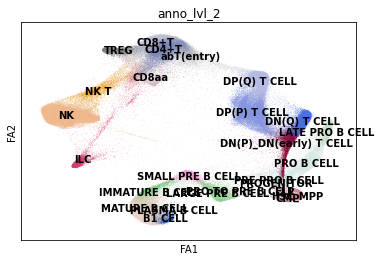

In [12]:
sc.pl.draw_graph(adata, color="anno_lvl_2", legend_loc="on data")

In [344]:
anno_col="anno_lvl_2"
scatter_array = adata.obsm['X_draw_graph_fa']
scatter_df = pd.DataFrame(scatter_array, columns=["x", "y"])
scatter_df["color_source"] = adata.obs[anno_col].values
all_pos = (
            scatter_df
            .groupby('color_source', observed=True)
            .median()
        )
all_pos = all_pos.loc[adata.obs[anno_col].cat.categories]

ERROR! Session/line number was not unique in database. History logging moved to new session 233


In [ ]:
sc.tl.paga(adata, groups = anno_col, neighbors_key = "bbknn50")

Trying to set attribute `.uns` of view, copying.


In [ ]:
sc.pl.paga(adata, color='age', threshold=0.7, layout='fa', frameon=False, fontsize=7, node_size_scale=1,
           max_edge_width=0.9, colorbar=False, pos=all_pos.value)

---

### Load

In [7]:
adata = panfetal_utils._load_split_and_annotation("NKT_CLEAN", data_dir='/nfs/team205/ed6/data/Fetal_immune/tmp/')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [8]:
## Remove cells missing annotation
adata = adata[adata.obs["anno_lvl_2"] !='nan']

In [12]:
adata.uns["bbknn"] = adata.uns["neighbors"]
adata.obsp["bbknn_connectivities"] = adata.obsp["connectivities"]
adata.obsp["bbknn_distances"] = adata.obsp["distances"]

Trying to set attribute `.uns` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


### Save BBKNN graphs 
(on top of precomputed one)
1. Directed BBKNN graph: more edges within the same age
2. With trimming

In [13]:
import directed_bbknn
from bbknn import bbknn

In [ ]:
# bbknn(adata, batch_key = "bbk", n_pcs=30, approx=True, trim=30)
# adata.uns["bbknn30"] = adata.uns["neighbors"]
# adata.obsp["bbknn30_connectivities"] = adata.obsp["connectivities"]
# adata.obsp["bbknn30_distances"] = adata.obsp["distances"]

In [ ]:
# directed_bbknn.directed_bbknn(adata, batch_key="bbk", sorting_key="age", tot_neighbors=30)
# adata.uns["age_bbknn30"] = adata.uns["neighbors"]
# adata.obsp["age_bbknn30_connectivities"] = adata.obsp["connectivities"]
# adata.obsp["age_bbknn30_distances"] = adata.obsp["distances"]

In [124]:
directed_bbknn.directed_bbknn(adata, batch_key="bbk", sorting_key="age", tot_neighbors=50)
adata.uns["age_bbknn50"] = adata.uns["neighbors"]
adata.obsp["age_bbknn50_connectivities"] = adata.obsp["connectivities"]
adata.obsp["age_bbknn50_distances"] = adata.obsp["distances"]

In [131]:
adata.write_h5ad(writedir+"NKT_BBKNNtests.h5ad")

In [8]:
adata = sc.read_h5ad(writedir+"NKT_BBKNNtests.h5ad")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [ ]:
sc.pl.draw_graph(adata, color="sort")

### Visualize graphs

Run UMAP + PAGA

In [138]:
def run_PAGA_FA(adata, key, anno_col='anno_lvl_2'):
    ## PAGA by annotated cell types
    sc.tl.paga(adata, groups = anno_col, neighbors_key = key)
    plt.rcParams["figure.figsize"] = [8,8]
    sc.pl.paga(adata, color='age', threshold=0.3, layout='fa', frameon=False, fontsize=7, node_size_scale=0.5,
               max_edge_width=0.6, colorbar=False, save="_" + key + "_anno.pdf")
    ## FA graph layout
    sc.tl.draw_graph(adata, init_pos='paga', maxiter=100)
    draw_graph_fa_file = "X_draw_graph_fa_paga.{k}.{a}.npy".format(k=key, a=anno_col)
    np.save(writedir + draw_graph_fa_file, adata.obsm['X_draw_graph_fa'])
    sc.pl.draw_graph(
        adata,
        color=[anno_col, 'age'],
        legend_loc='on data', legend_fontsize=10, save="PAGA_FA.{k}.{a}.pdf".format(k=key, a=anno_col))
    ## Get annotation centroid positions
    scatter_array = adata.obsm['X_draw_graph_fa']
    scatter_df = pd.DataFrame(scatter_array, columns=["x", "y"])
    scatter_df["color_source"] = adata.obs[anno_col].values
    all_pos = (
                scatter_df
                .groupby('color_source', observed=True)
                .median()
            )
    all_pos = all_pos.loc[adata.obs[anno_col].cat.categories]

    sc.pl.paga(adata, color='age', threshold=0.7, layout='fa', frameon=False, fontsize=7, 
               node_size_scale=1,
               max_edge_width=0.9, colorbar=False, pos=all_pos.values,
              save="PAGA_FA.{k}.{a}.pdf".format(k=key, a=anno_col))

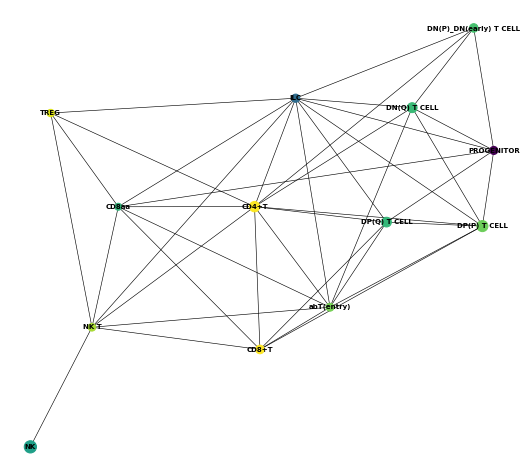

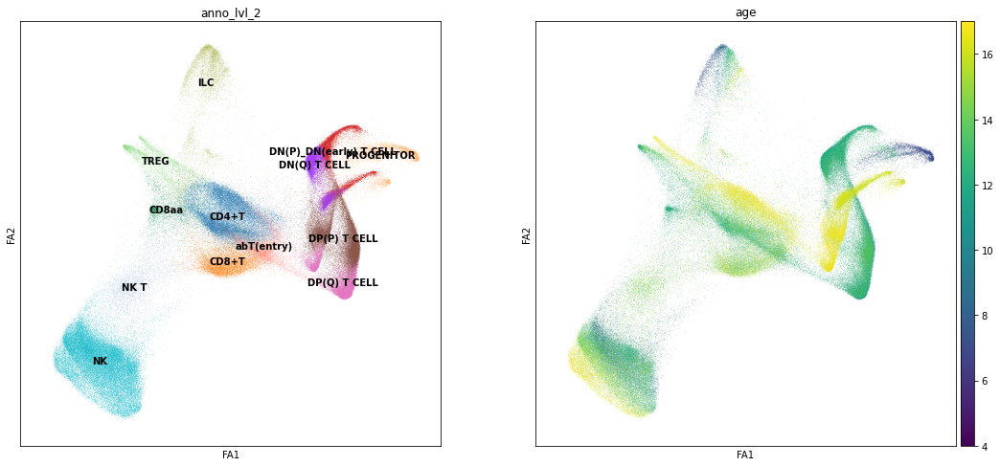

In [141]:
run_PAGA_FA(adata, key="age_bbknn50")

In [10]:
adata.obsm['X_draw_graph_fa'] = np.load(writedir + 'X_draw_graph_fa_paga.{k}.{a}.npy'.format(k="bbknn50", a="anno_lvl_2"))
adata.uns['draw_graph'] = {'params': {'layout': 'fa'}}

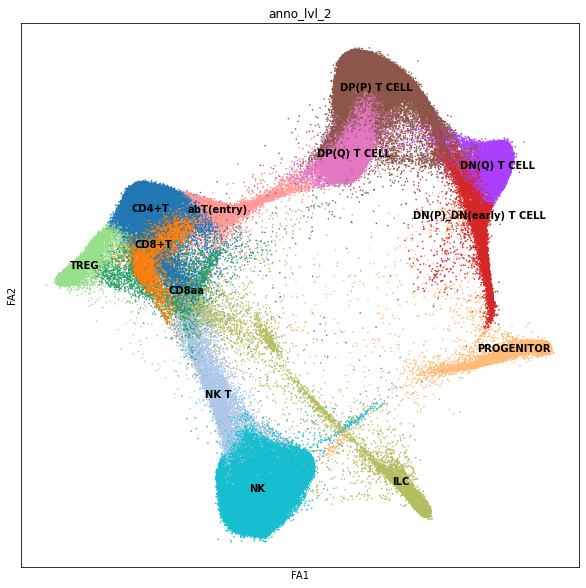

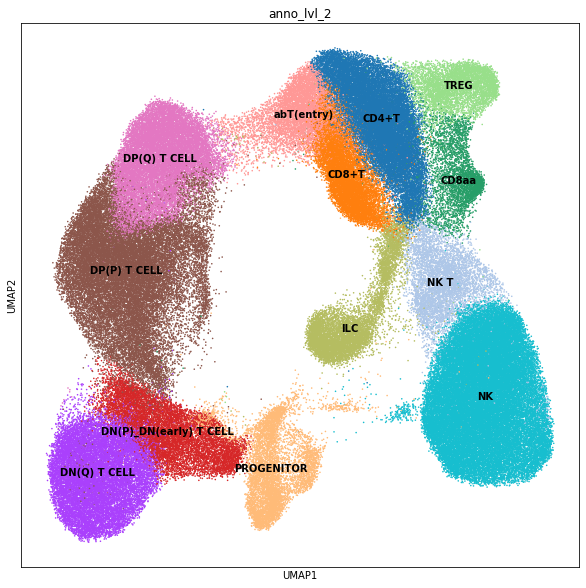

In [318]:
sc.pl.draw_graph(
        adata,
        color=['anno_lvl_2'], size=10,
        legend_loc='on data', legend_fontsize=10)
sc.pl.umap(
        adata,
        color=['anno_lvl_2'], size=10,
        legend_loc='on data', legend_fontsize=10)

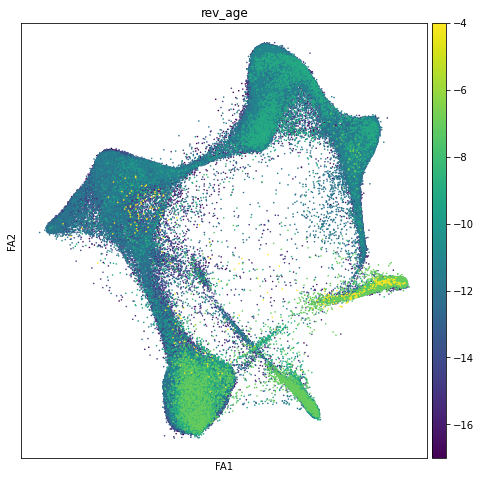

In [147]:
adata.obs["rev_age"] = - adata.obs["age"]

sc.pl.draw_graph(
        adata,
        color=['rev_age'], size=10,
        legend_loc='on data', legend_fontsize=10)

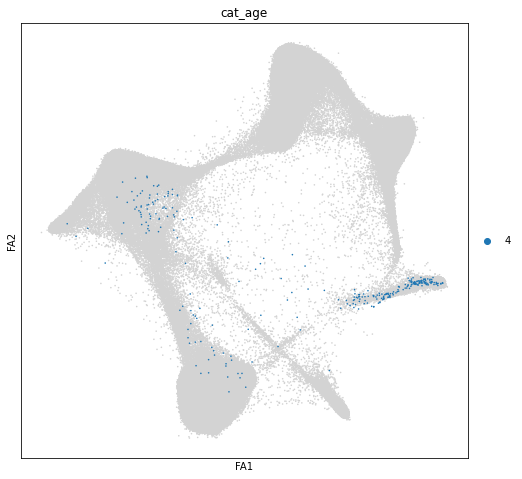

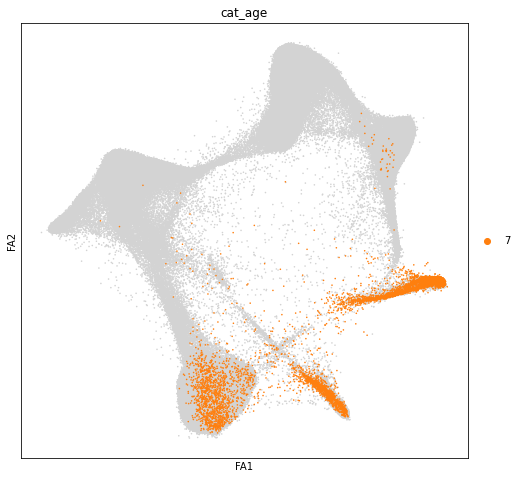

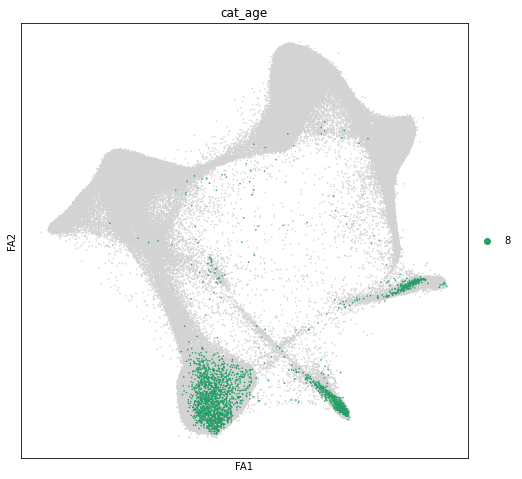

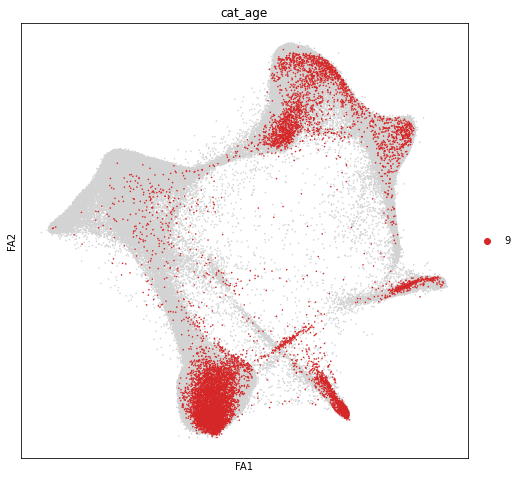

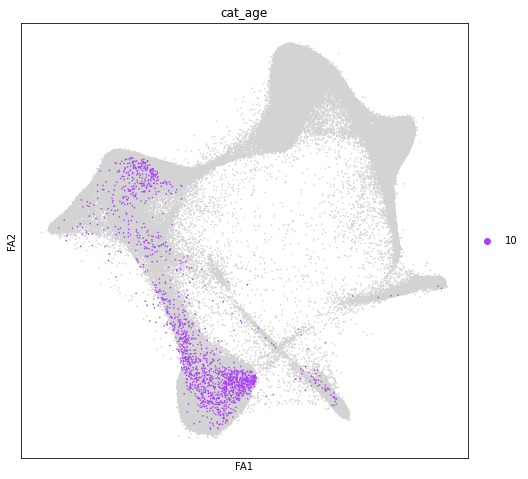

...

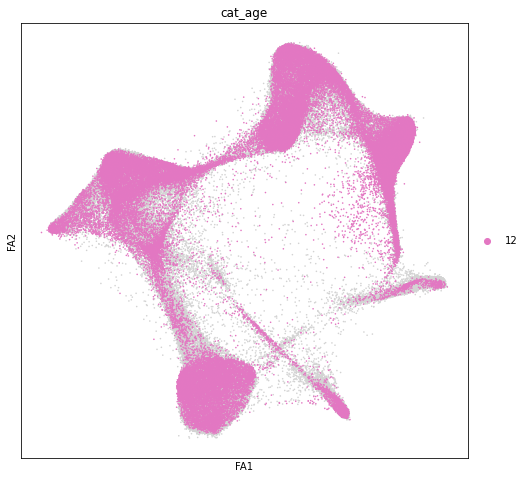

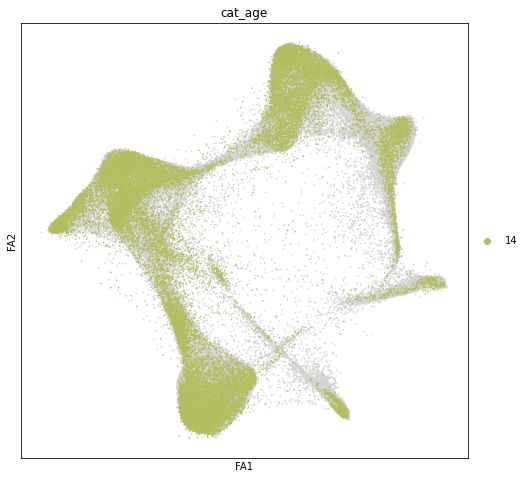

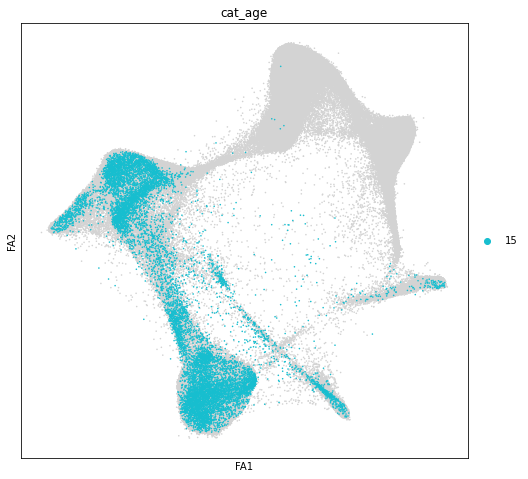

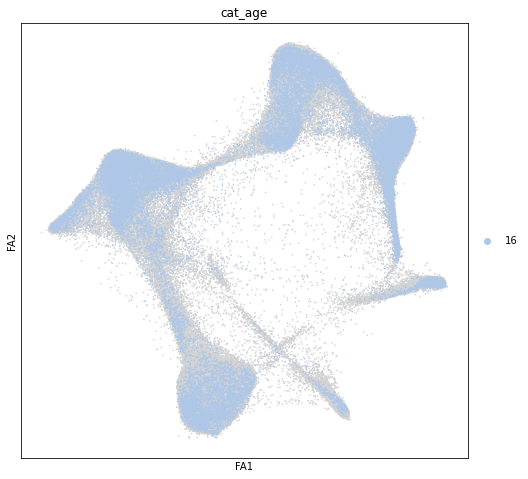

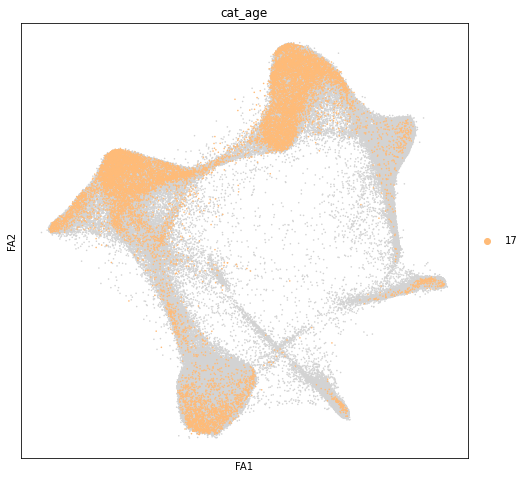

In [148]:
adata.obs["cat_age"] = adata.obs["age"].astype("category")
for a in adata.obs["cat_age"].cat.categories:
    sc.pl.draw_graph(
        adata,
        color=['cat_age'], size=10, groups=[a])

### PAGA on KNN graph biased by age

In [11]:
def _bias_knn_age(conn, time, n_neighbors, k=3, max_time_gap=3):
    k_thresh = np.min([int(np.floor(n_neighbors / k)) - 1, 30])
    conn_biased = conn.copy()

    # loop over rows in the adjacency matrix
    for i in range(conn.shape[0]):
        # get indices, values and current pseudo t
        row_data = conn[i, :].data
        row_ixs = conn[i, :].indices
        current_t = time[i]

        # # get the 'candidates' - ixs of nodes not in the k_thresh closest neighbors
        # p = np.flip(np.argsort(row_data))
        # sorted_ixs = row_ixs[p]
        # cand_ixs = sorted_ixs[k_thresh:]

        # compare pseudotimes and set indices to zero
        cand_t = time[row_ixs]
        rem_early_ixs = row_ixs[cand_t < current_t]
        rem_late_ixs = row_ixs[cand_t > (current_t + max_time_gap)]
        rem_ixs = np.concatenate([rem_early_ixs, rem_late_ixs])
        conn_biased[i, rem_ixs] = 0

        conn_biased.eliminate_zeros()
        return(conn_biased)

In [12]:
conn = adata.obsp["bbknn50_connectivities"]
conn_biased = _bias_knn_age(conn, adata.obs["age"].values, n_neighbors=50)

In [13]:
conn_biased.data = np.array([1 for x in conn_biased.data])

In [14]:
## Compute transition matrix
# stealing code from scanpy.pp.neighbors
W = conn_biased
q = np.asarray(W.sum(axis=0))
Q = scipy.sparse.spdiags(1.0 / q, 0, W.shape[0], W.shape[0])
K = Q @ W @ Q
z = np.sqrt(np.asarray(K.sum(axis=0)))
Z = scipy.sparse.spdiags(1.0 / z, 0, K.shape[0], K.shape[0])
t_mat = Z @ K @ Z

In [15]:
from sklearn.preprocessing import normalize
# w = W[0:10,0:10]
t_mat_normalized = normalize(t_mat, norm='l1', axis=1)

In [16]:
age_k = cr.tl.kernels.PrecomputedKernel(t_mat_normalized, adata)

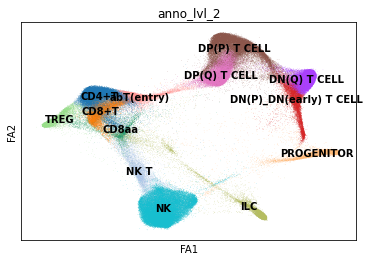

In [17]:
sc.pl.draw_graph(adata, color="anno_lvl_2", legend_loc="on data")

In [18]:
## Set tip of graph as root cell for DPT
adata.uns["iroot"] = adata.obsm["X_draw_graph_fa"][:,0].argmax()

In [19]:
g = cr.tl.estimators.GPCCA(age_k)

In [20]:
g.compute_schur(n_components=10, method="krylov")

In [21]:
g.compute_gdpt()

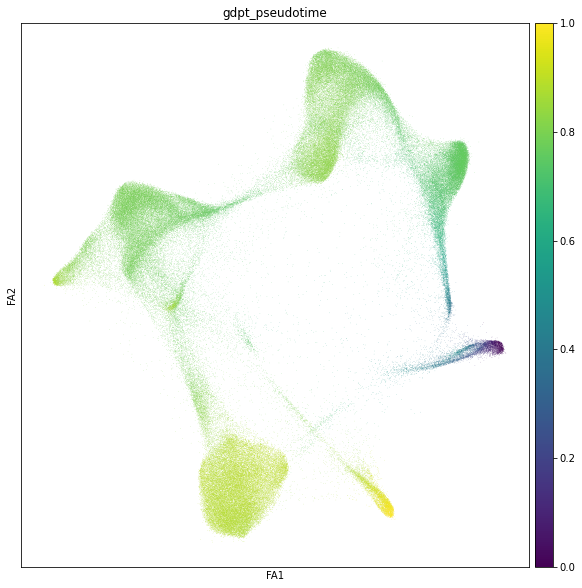

In [22]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.draw_graph(adata, color='gdpt_pseudotime')

In [23]:
anno_dpt_order = adata.obs[["anno_lvl_2", "gdpt_pseudotime"]].groupby('anno_lvl_2')
anno_order = anno_dpt_order.median("gdpt_pseudotime").sort_values("gdpt_pseudotime").index

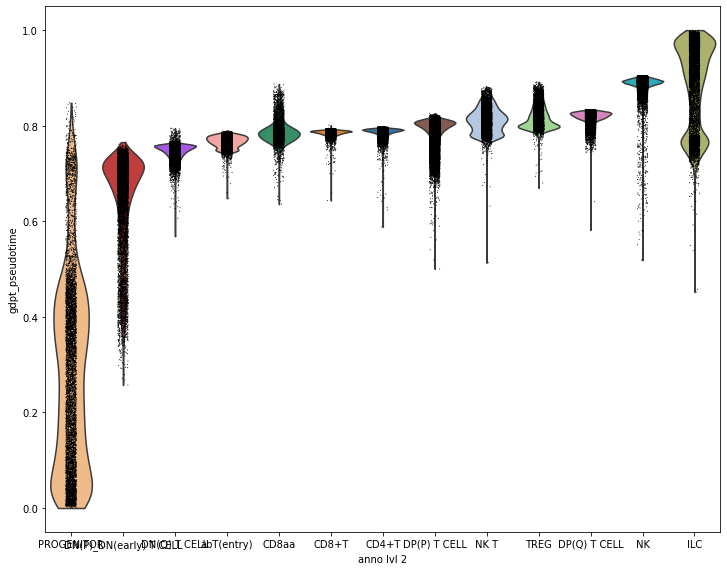

In [24]:
sc.pl.violin(adata, "gdpt_pseudotime",groupby="anno_lvl_2", order=anno_order)

In [28]:
terminal_states = ["CD4+T", "NK", "TREG", "ILC"]
n_top = 20
term_states_dict = {}
for state in terminal_states:
    term_states_dict[state] = adata.obs[adata.obs["anno_lvl_2"] == state].gdpt_pseudotime.nlargest(n_top).index

In [29]:
g.set_terminal_states(term_states_dict)

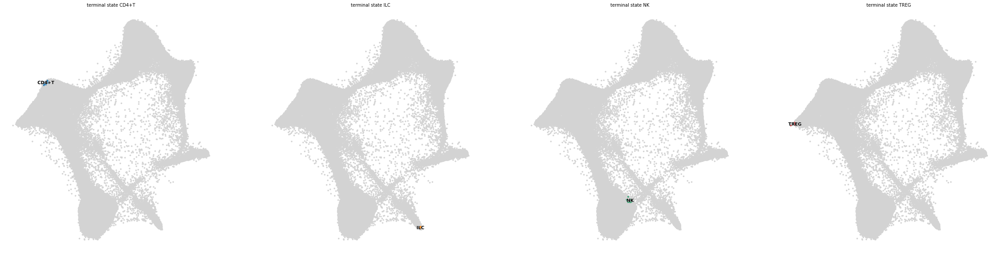

In [30]:
g.plot_terminal_states(same_plot=False, size=50, basis="draw_graph_fa")

In [31]:
g.compute_absorption_probabilities(use_petsc=True, n_jobs=10)

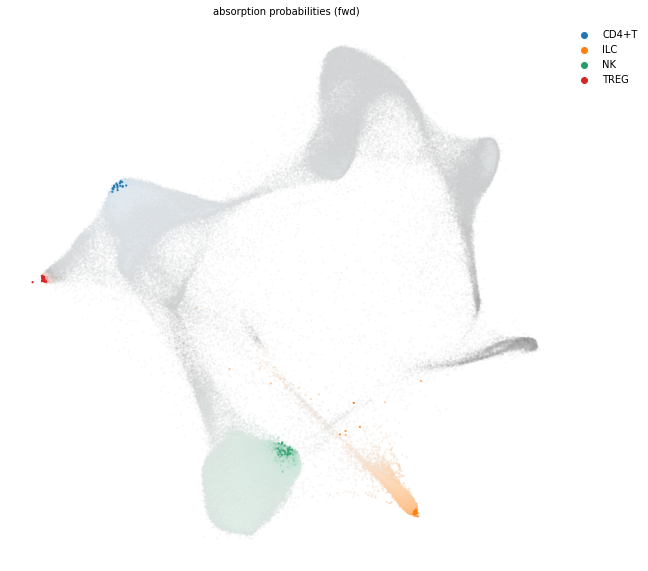

In [32]:
g.plot_absorption_probabilities(size=20, basis="draw_graph_fa")

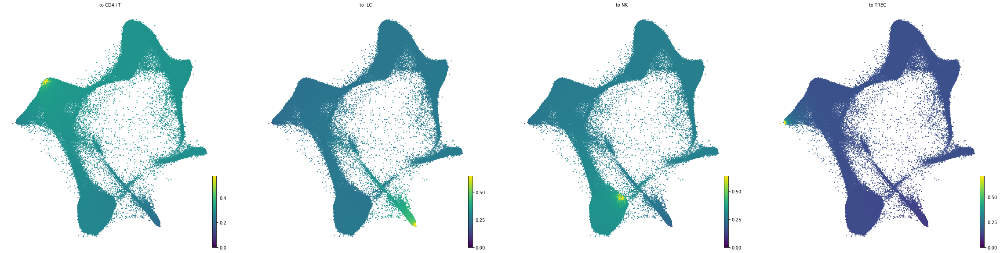

In [34]:
g.plot_absorption_probabilities(size=20, basis="draw_graph_fa", same_plot=False)

In [149]:
adata.obs["ILC_probability"] = adata.obsm["to_terminal_states"]["ILC"].X
adata.obs["NK_probability"] = adata.obsm["to_terminal_states"]["NK"].X
adata.obs["CD4_probability"] = adata.obsm["to_terminal_states"]["CD4+T"].X

In [45]:
adata.obs["dpt_rank"] = adata.obs["gdpt_pseudotime"].rank()

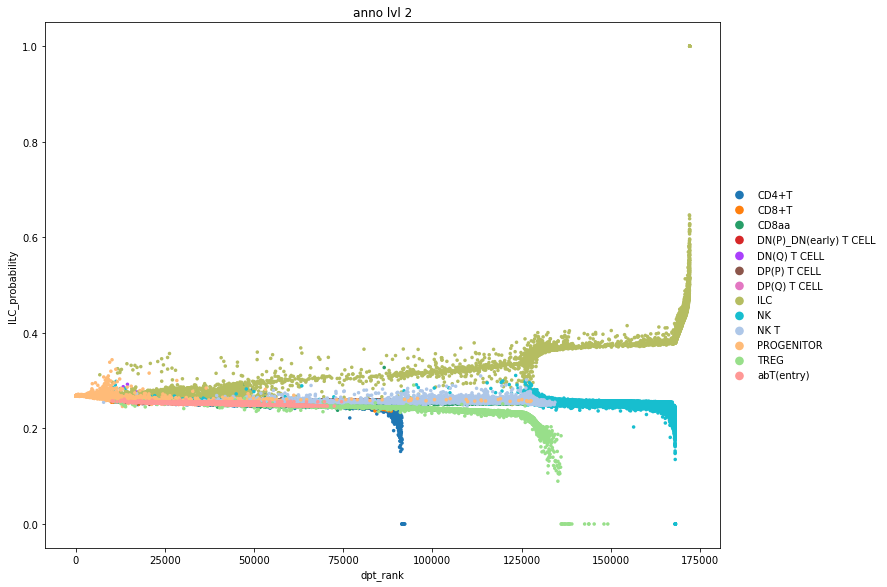

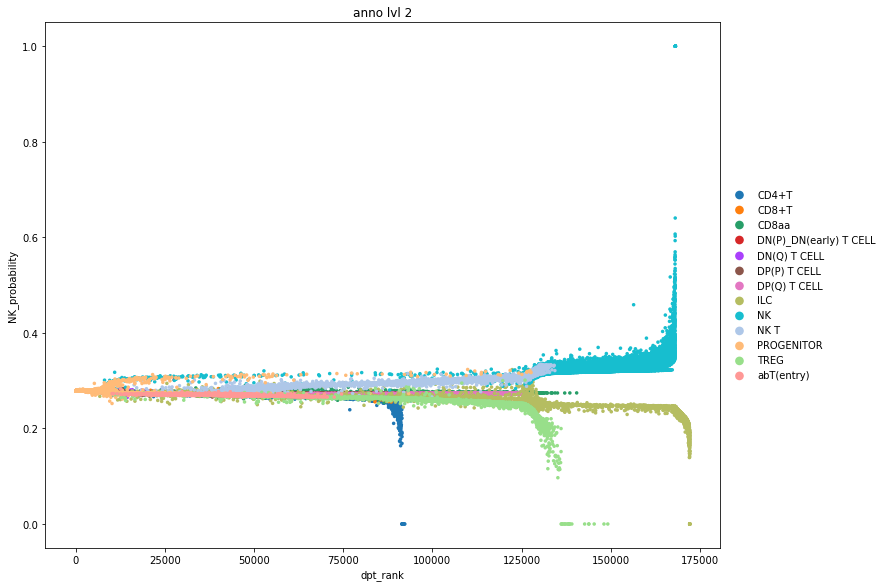

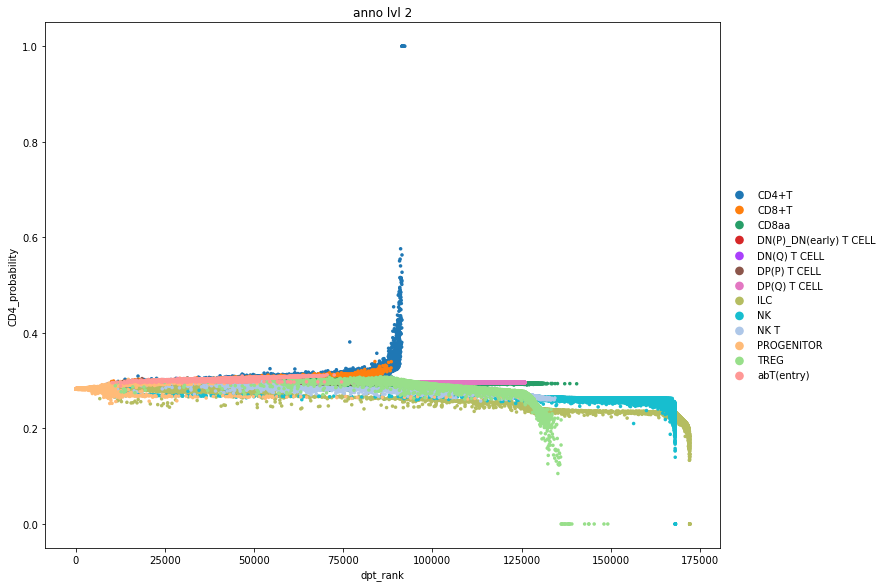

In [150]:
sc.pl.scatter(adata, "dpt_rank", "ILC_probability", size=50, color="anno_lvl_2")
sc.pl.scatter(adata, "dpt_rank", "NK_probability", size=50, color="anno_lvl_2")
sc.pl.scatter(adata, "dpt_rank", "CD4_probability", size=50, color="anno_lvl_2")

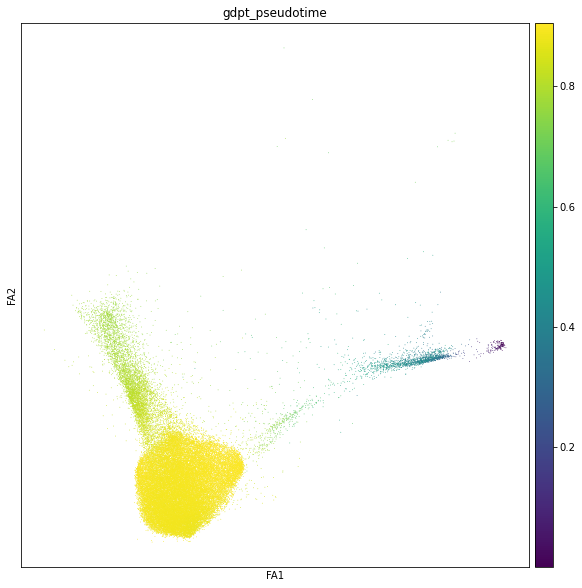

In [161]:
adata.obsm["to_terminal_states"]
NK_lineage_cells = lin["NK"] > lin[adata.uns['iroot'], "NK"].X
sc.pl.draw_graph(adata[NK_lineage_cells.X], color="gdpt_pseudotime")

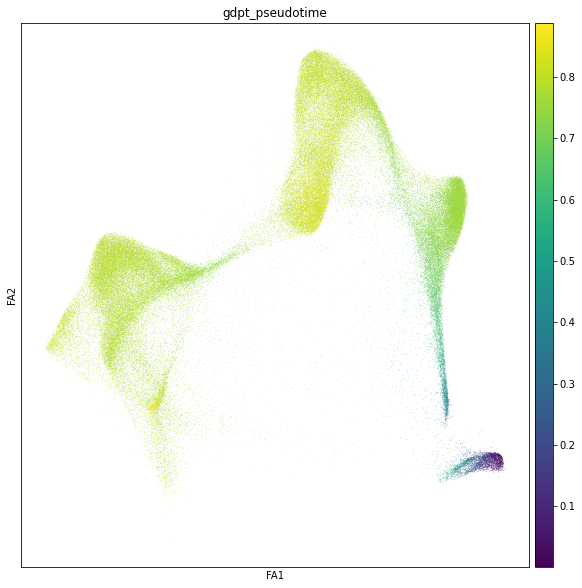

In [162]:
adata.obsm["to_terminal_states"]
CD4_lineage_cells = lin["CD4+T"] > lin[adata.uns['iroot'], "CD4+T"].X
sc.pl.draw_graph(adata[CD4_lineage_cells.X], color="gdpt_pseudotime")

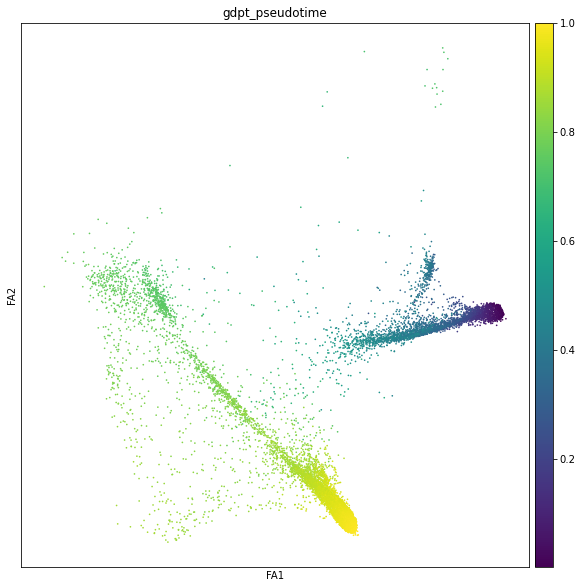

In [163]:
adata.obsm["to_terminal_states"]
ILC_lineage_cells = lin["ILC"] > lin[adata.uns['iroot'], "ILC"].X
sc.pl.draw_graph(adata[ILC_lineage_cells.X], color="gdpt_pseudotime")

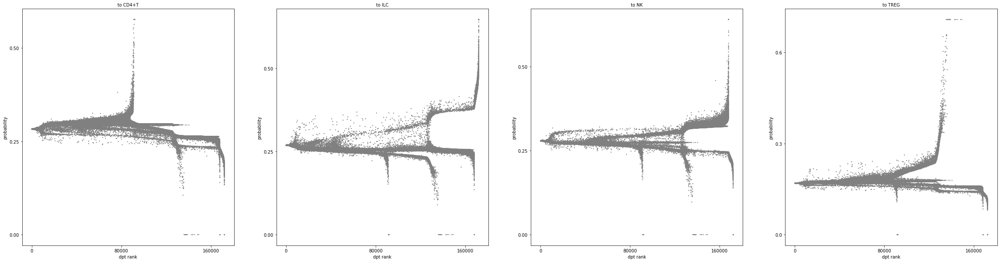

In [170]:
cr.pl.lineages(adata,mode="time", time_key="dpt_rank", same_plot=True, size=20)


In [171]:
adata.write_h5ad(writedir+"NKT_cellrank_ageK.h5ad")

### Compare with simple connectivity

In [176]:
conn_k = cr.tl.kernels.ConnectivityKernel(adata,conn_key="bbknn50_connectivities")

In [178]:
## Set tip of graph as root cell for DPT
adata.uns["iroot"] = adata.obsm["X_draw_graph_fa"][:,0].argmax()

In [179]:
g = cr.tl.estimators.GPCCA(conn_k)

In [180]:
g.compute_schur(n_components=10, method="krylov")

In [181]:
g.compute_gdpt()

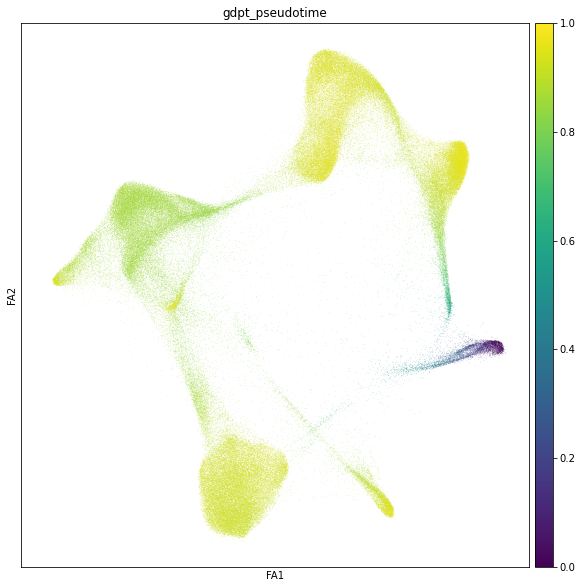

In [182]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.draw_graph(adata, color='gdpt_pseudotime')

In [183]:
anno_dpt_order = adata.obs[["anno_lvl_2", "gdpt_pseudotime"]].groupby('anno_lvl_2')
anno_order = anno_dpt_order.median("gdpt_pseudotime").sort_values("gdpt_pseudotime").index

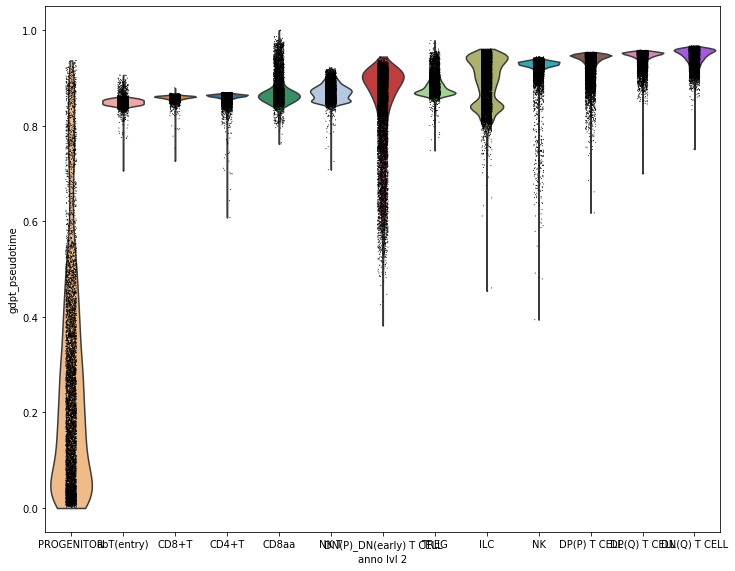

In [184]:
sc.pl.violin(adata, "gdpt_pseudotime",groupby="anno_lvl_2", order=anno_order)

In [185]:
terminal_states = ["CD4+T", "NK", "TREG", "ILC"]
n_top = 20
term_states_dict = {}
for state in terminal_states:
    term_states_dict[state] = adata.obs[adata.obs["anno_lvl_2"] == state].gdpt_pseudotime.nlargest(n_top).index

In [186]:
g.set_terminal_states(term_states_dict)

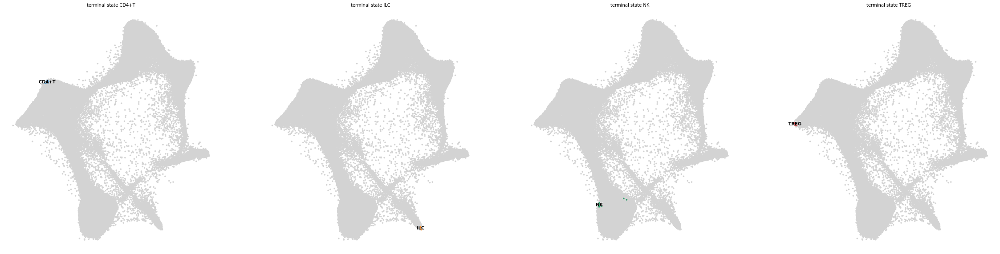

In [187]:
g.plot_terminal_states(same_plot=False, size=50, basis="draw_graph_fa")

In [188]:
g.compute_absorption_probabilities(use_petsc=True, n_jobs=10)

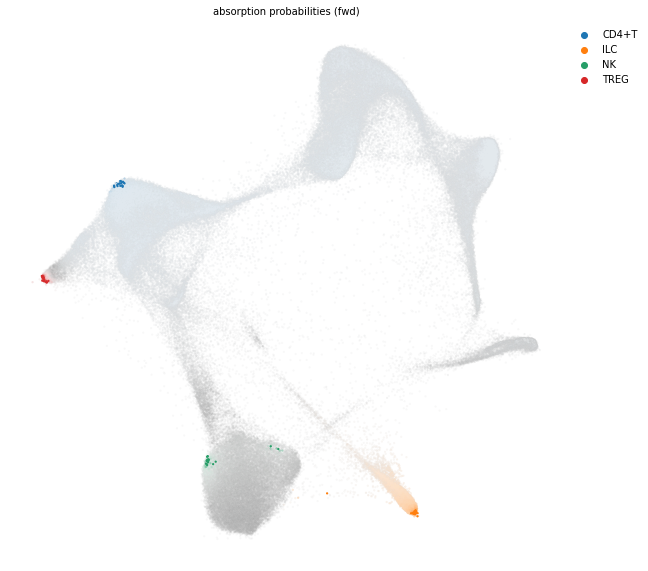

In [189]:
g.plot_absorption_probabilities(size=20, basis="draw_graph_fa")

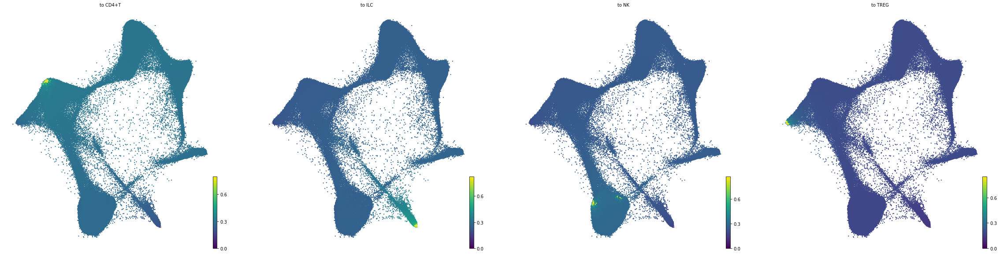

In [190]:
g.plot_absorption_probabilities(size=20, basis="draw_graph_fa", same_plot=False)

In [191]:
adata.obs["ILC_probability"] = adata.obsm["to_terminal_states"]["ILC"].X
adata.obs["NK_probability"] = adata.obsm["to_terminal_states"]["NK"].X
adata.obs["CD4_probability"] = adata.obsm["to_terminal_states"]["CD4+T"].X

In [192]:
adata.obs["dpt_rank"] = adata.obs["gdpt_pseudotime"].rank()

... storing 'terminal_states_probs' as categorical


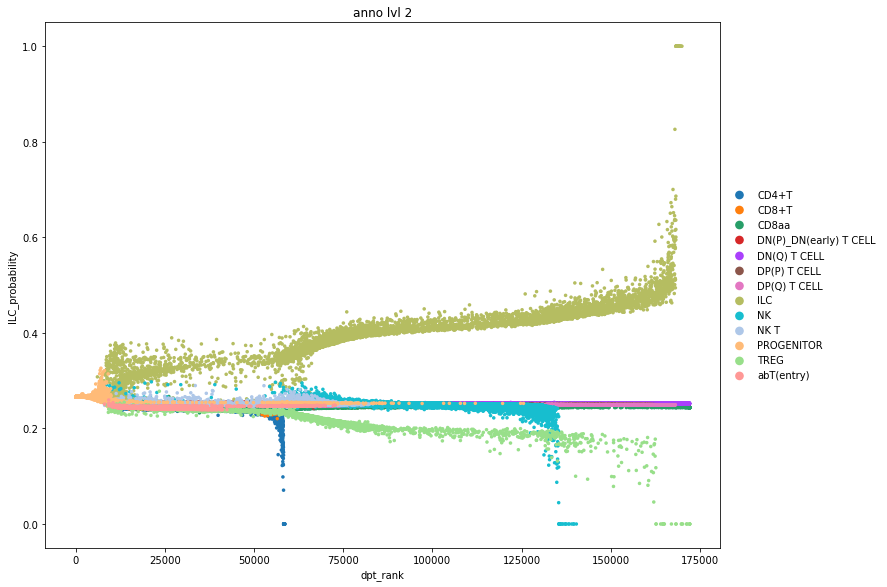

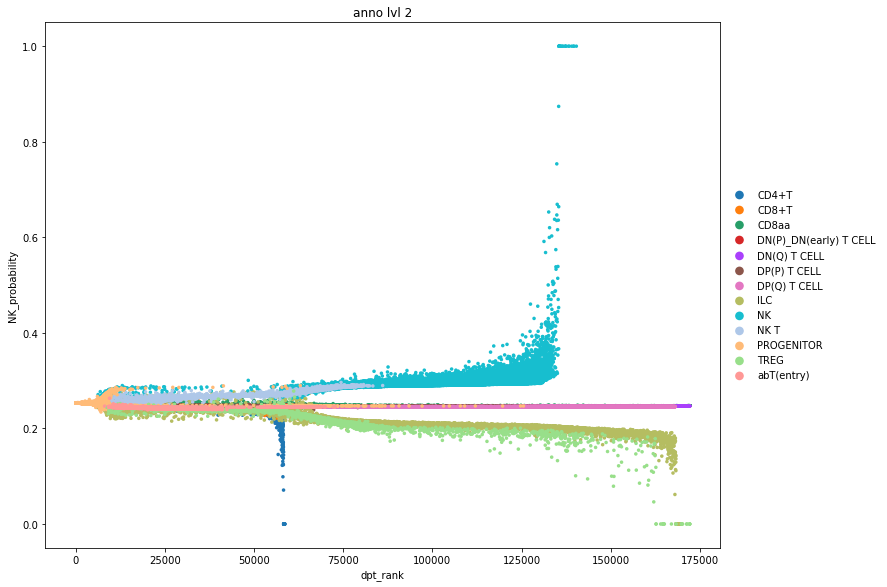

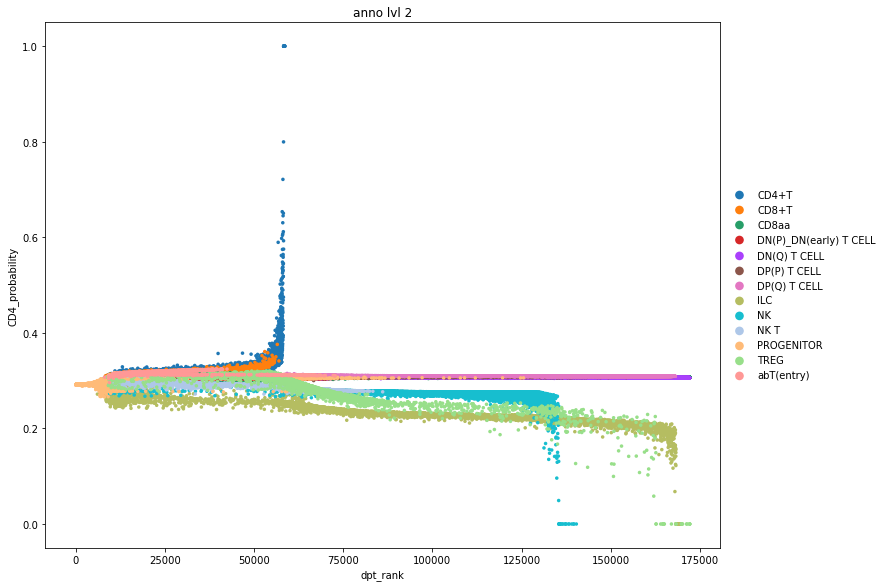

In [193]:
sc.pl.scatter(adata, "dpt_rank", "ILC_probability", size=50, color="anno_lvl_2")
sc.pl.scatter(adata, "dpt_rank", "NK_probability", size=50, color="anno_lvl_2")
sc.pl.scatter(adata, "dpt_rank", "CD4_probability", size=50, color="anno_lvl_2")

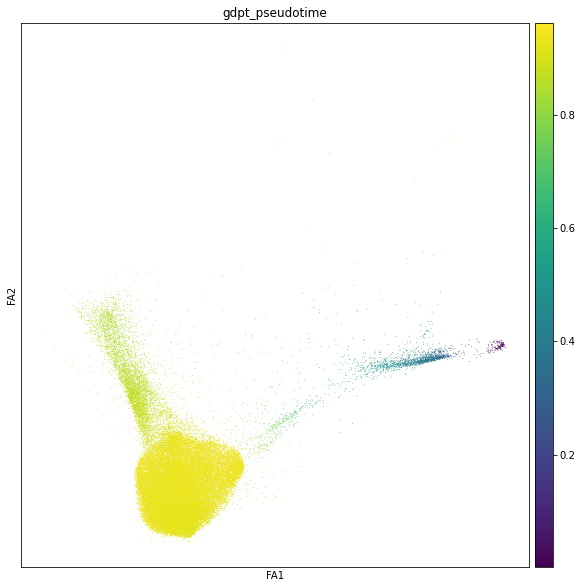

In [194]:
adata.obsm["to_terminal_states"]
NK_lineage_cells = lin["NK"] > lin[adata.uns['iroot'], "NK"].X
sc.pl.draw_graph(adata[NK_lineage_cells.X], color="gdpt_pseudotime")

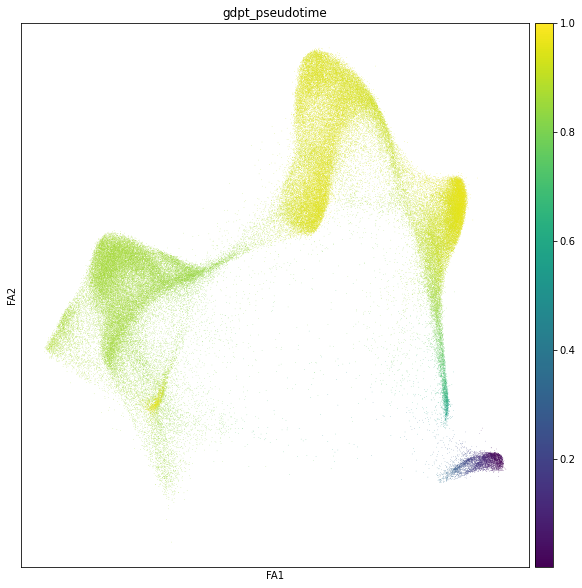

In [195]:
adata.obsm["to_terminal_states"]
CD4_lineage_cells = lin["CD4+T"] > lin[adata.uns['iroot'], "CD4+T"].X
sc.pl.draw_graph(adata[CD4_lineage_cells.X], color="gdpt_pseudotime")

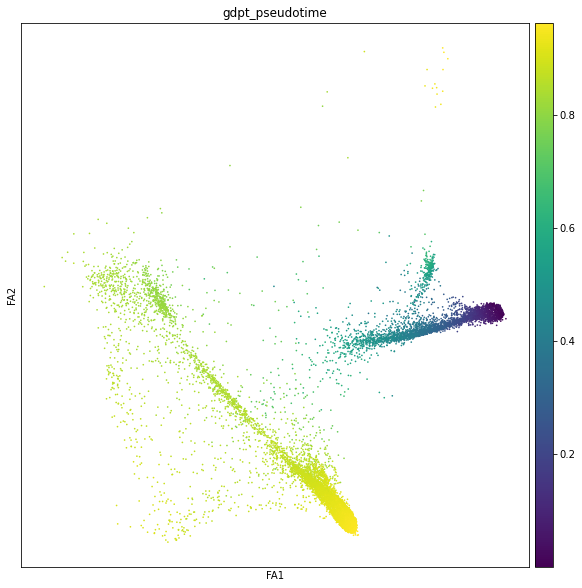

In [196]:
adata.obsm["to_terminal_states"]
ILC_lineage_cells = lin["ILC"] > lin[adata.uns['iroot'], "ILC"].X
sc.pl.draw_graph(adata[ILC_lineage_cells.X], color="gdpt_pseudotime")

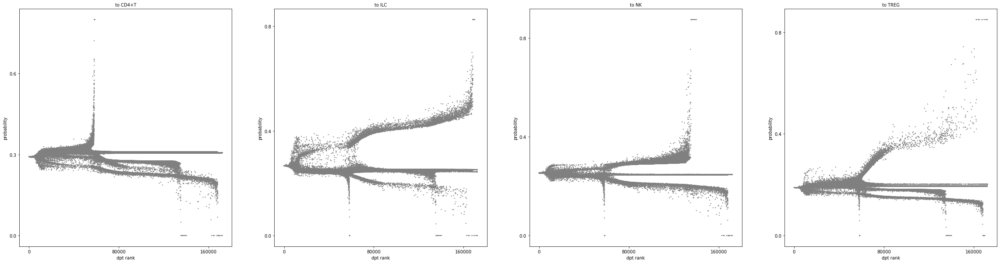

In [197]:
cr.pl.lineages(adata,mode="time", time_key="dpt_rank", same_plot=True, size=20)


In [200]:
adata.write_h5ad(writedir+"NKT_cellrank_connK.h5ad")

In [203]:
adata_ageK = sc.read_h5ad(writedir+"NKT_cellrank_ageK.h5ad", backed="r")

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


### Compare pseudotime estimate

In [205]:
adata.obs['gdpt_ageK'] = adata_ageK.obs["gdpt_pseudotime"]

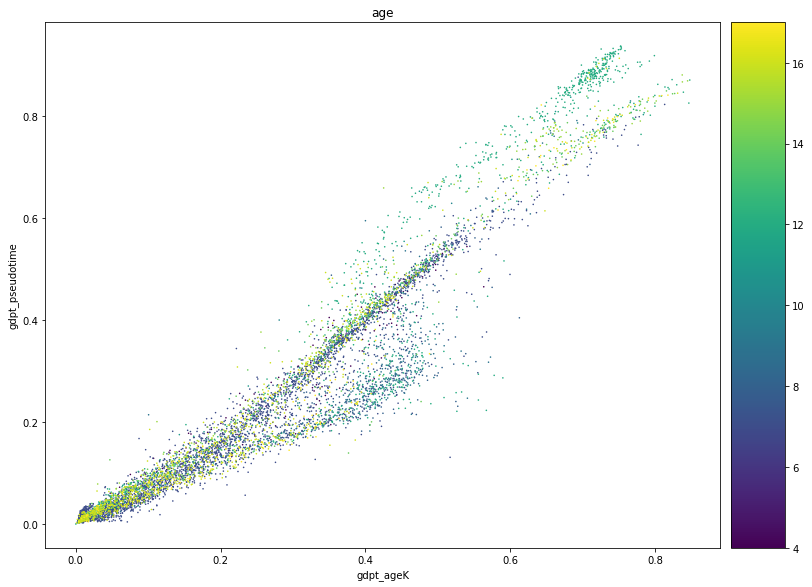

In [224]:
adata.obs['age'] = adata.obs['age'].astype("int")
sc.pl.scatter(adata[adata.obs.anno_lvl_2=="PROGENITOR"], "gdpt_ageK", "gdpt_pseudotime", color="age", size=10)

In [ ]:
sc.pl.draw_graph(adata)

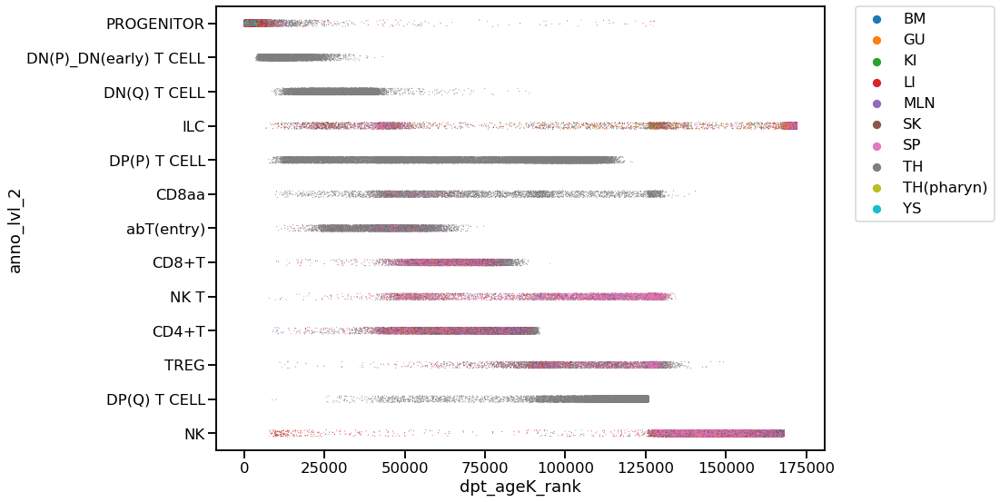

In [334]:
adata.obs["dpt_ageK_rank"] = adata.obs["gdpt_ageK"].rank()
time_key='dpt_ageK_rank'
anno_dpt_order = adata.obs[["anno_lvl_2", time_key]].groupby('anno_lvl_2')
anno_order = anno_dpt_order.first(time_key).sort_values(time_key).index

plt.rcParams["figure.figsize"] = [12,9]
sns.set_context("talk")
sns.stripplot(data=adata.obs[["anno_lvl_2",time_key, "organ"]], x=time_key, y="anno_lvl_2", size=1, order=anno_order, hue="organ")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

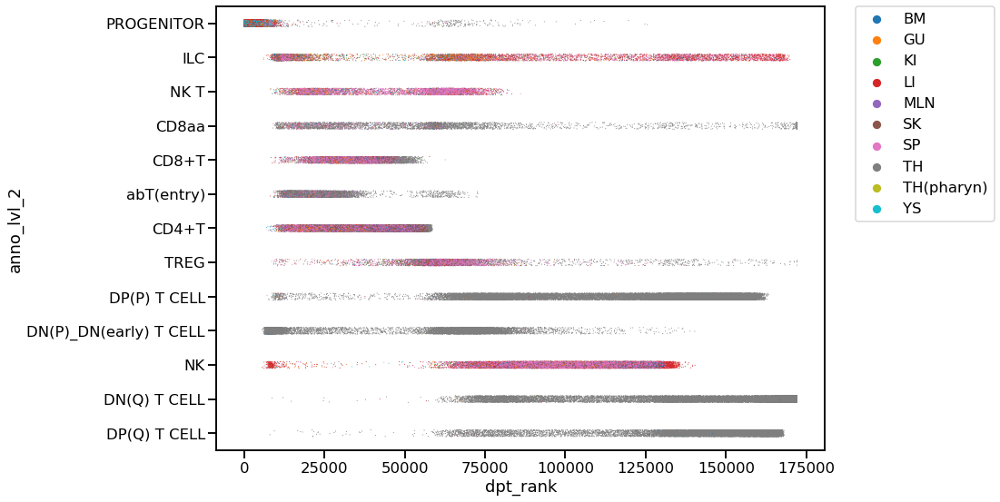

In [333]:
time_key='dpt_rank'
anno_dpt_order = adata.obs[["anno_lvl_2", time_key]].groupby('anno_lvl_2')
anno_order = anno_dpt_order.first(time_key).sort_values(time_key).index

plt.rcParams["figure.figsize"] = [12,9]
sns.set_context("talk")
sns.stripplot(data=adata.obs[["anno_lvl_2",time_key, "organ"]], x=time_key, y="anno_lvl_2", size=1, order=anno_order, hue="organ")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [286]:
import sklearn.preprocessing 
## Assign cells to lineages
lin = adata.obsm['to_terminal_states']
for l in lin.names:
    min_p = lin[adata.uns['iroot'], l]
    adata.obs['is_lineage_'+l] = lin[l]
    adata.obs['is_lineage_'+l][(lin[l] < min_p).X.flatten()] = 0
    adata.obs['is_lineage_'+l] = sklearn.preprocessing.scale(adata.obs['is_lineage_'+l])

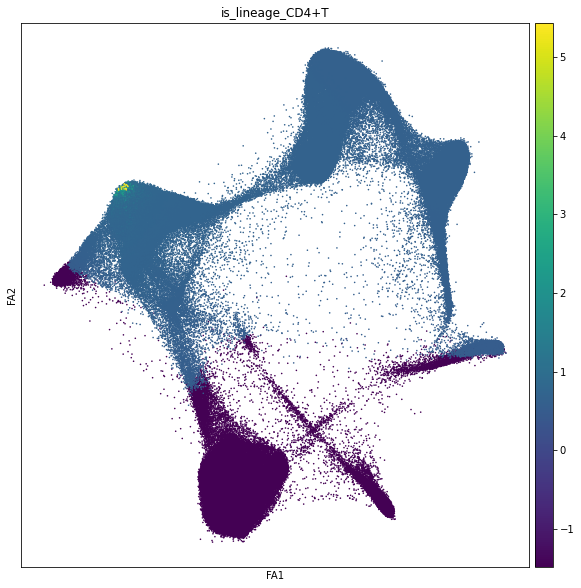

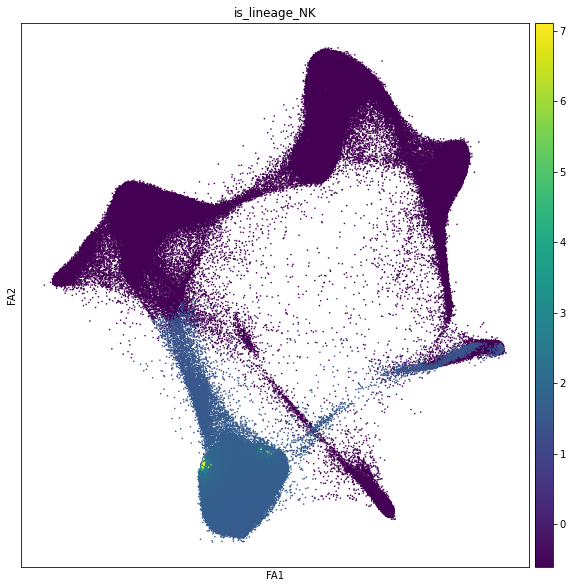

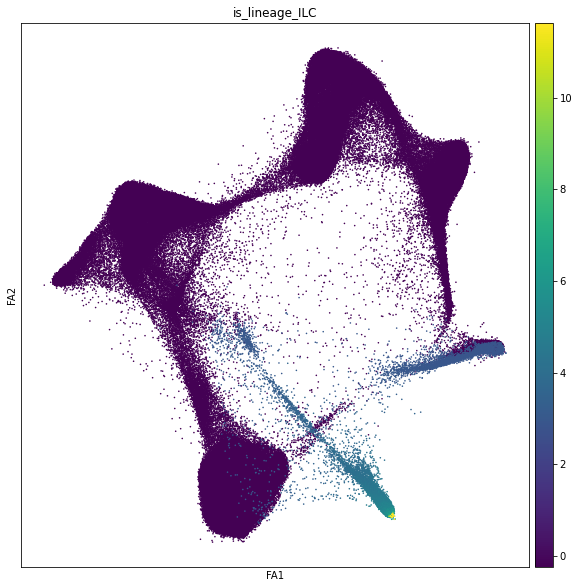

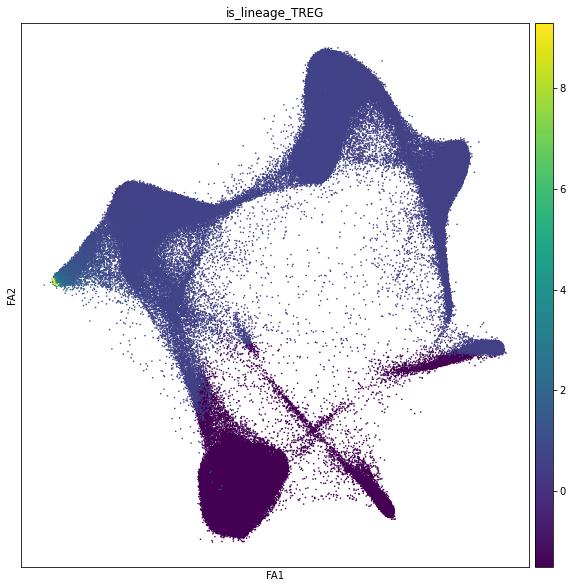

In [314]:
sc.pl.draw_graph(adata, color='is_lineage_CD4+T', size=10, )
sc.pl.draw_graph(adata, color='is_lineage_NK', size=10)
sc.pl.draw_graph(adata, color='is_lineage_ILC', size=10)
sc.pl.draw_graph(adata, color='is_lineage_TREG', size=10)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


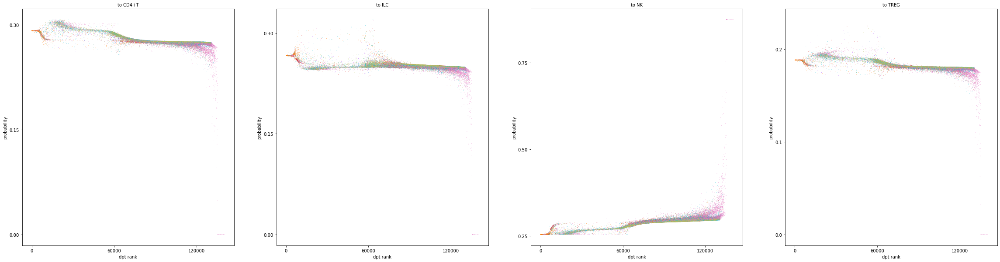

In [295]:
cr.pl.lineages(adata[adata.obs["is_lineage_NK"]> 0], mode="time", time_key="dpt_rank", color="age")

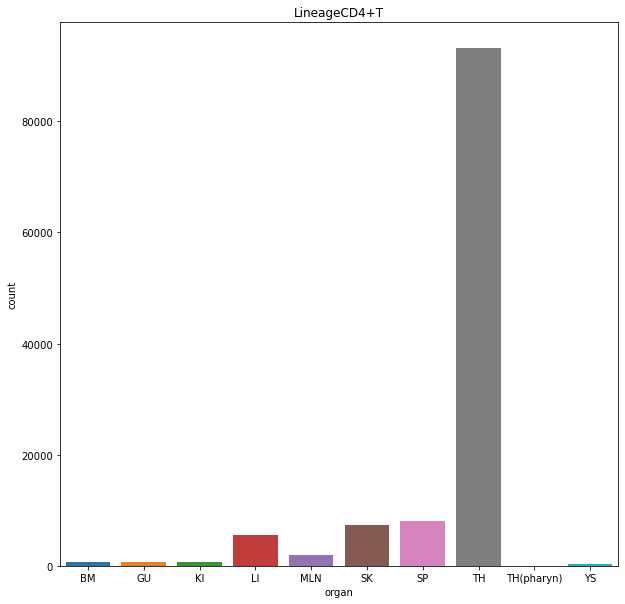

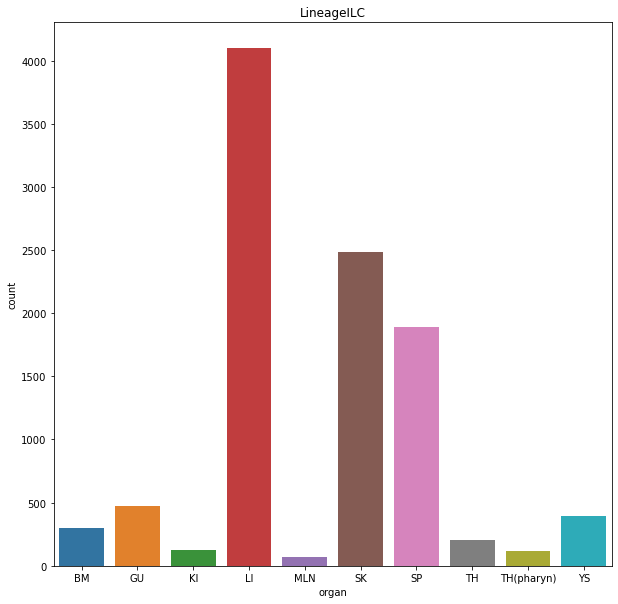

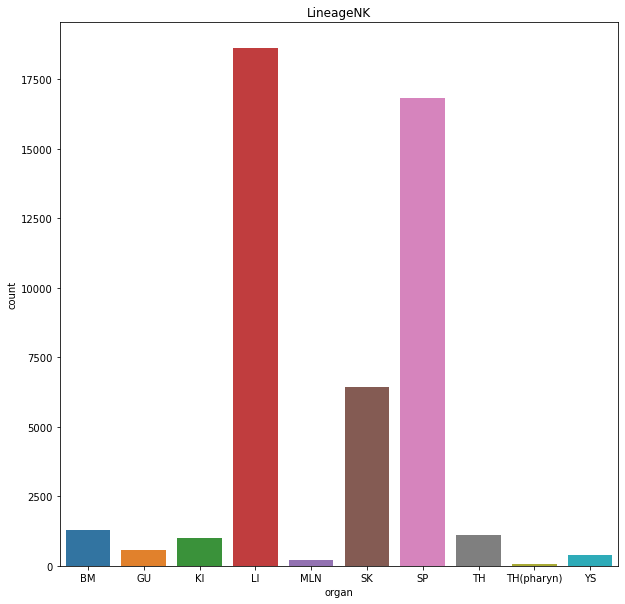

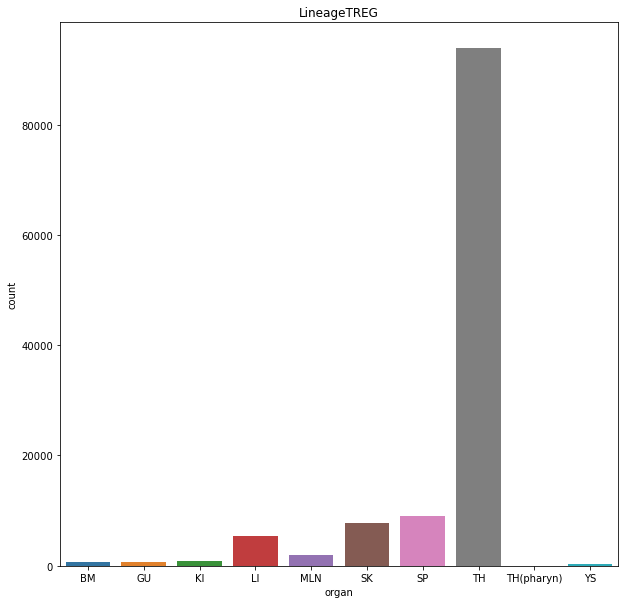

In [312]:
time_key="dpt_rank"
lin = adata.obsm['to_terminal_states']
for l in lin.names:
    df = adata[adata.obs["is_lineage_" + l]> 0].obs[["organ"]]
    df['count']=1
    df = df.groupby('organ').count().reset_index()
    sns.barplot(data=df,x='organ', y="count" );
    plt.title("Lineage"+l);
    plt.show()

In [ ]:
adata.obs["dpt_ageK_rank"] = adata.obs["gdpt_ageK"].rank()
time_key='dpt_ageK_rank'
anno_dpt_order = adata.obs[["anno_lvl_2", time_key]].groupby('anno_lvl_2')
anno_order = anno_dpt_order.median(time_key).sort_values(time_key).index

sns.stripplot(data=adata.obs[["anno_lvl_2",time_key]], x=time_key, y="anno_lvl_2", size=1, order=anno_order)